## 1. Libraries

In [ ]:
# !pip install --upgrade tensorflow
# !pip install tensorflow-addons

In [ ]:
!pip install -q efficientnet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.4 MB/s eta 0:00:00


In [ ]:
!pip install kaggle

In [ ]:
!pip install pydicom

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 16.5 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


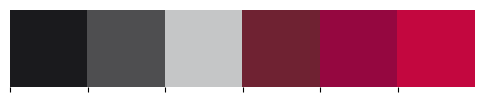

In [ ]:
import os, os.path
import re
import numpy as np
import pandas as pd
import random
import math
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
import seaborn as sns

from sklearn import metrics
from sklearn.model_selection import KFold, StratifiedKFold, GroupKFold
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
from sklearn import preprocessing

import tensorflow as tf
#from kaggle_datasets import KaggleDatasets
import efficientnet.tfkeras as efn
#import dill
from tensorflow.keras import backend as K

from PIL import Image
import gc
import cv2
import time
import datetime

import pydicom # for DICOM images
from skimage.transform import resize

import torch
from torch.utils.data import Dataset, DataLoader, Subset
import torchvision.transforms as transforms
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torch import FloatTensor, LongTensor

from albumentations import (ToFloat, Normalize, VerticalFlip, HorizontalFlip, Compose, Resize,
                            RandomBrightnessContrast, HueSaturationValue, Blur, GaussNoise,
                            Rotate, RandomResizedCrop, ShiftScaleRotate)

# from albumentations.pytorch import ToTensorV2, ToTensor

import keras
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
import numpy as np
import cv2
import math
from sklearn.metrics import confusion_matrix , classification_report
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, MaxPool2D
from keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img, img_to_array, array_to_img
from sklearn.metrics import ConfusionMatrixDisplay
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import  EfficientNetB7
import warnings
warnings.filterwarnings("ignore")

# Set Color Palettes for the notebook
colors_nude = ['#1A1A1D', '#4E4E50', '#C5C6C7', '#6F2232', '#950740', '#C3073F']
sns.palplot(sns.color_palette(colors_nude))

# Set Style
sns.set_style("whitegrid")
sns.despine(left=True, bottom=True)

## Device Selection

In [ ]:
def set_seed(seed = 1234):
    '''Sets the seed of the entire notebook so results are the same every time we run.
    This is for REPRODUCIBILITY.'''
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    # When running on the CuDNN backend, two further options must be set
    torch.backends.cudnn.deterministic = True
    # Set a fixed value for the hash seed
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device available now:', device)

Device available now: cuda


## 2. Importing Tabular Data

In [ ]:
directory = '../input/siim-isic-melanoma-classification'

train_df = pd.read_csv(directory + '/train.csv')
test_df = pd.read_csv(directory + '/test.csv')

print('Train has {} rows and Test has {} rows.'.format(len(train_df), len(test_df)))

Train has 33126 rows and Test has 10982 rows.


In [ ]:
roman_train = pd.read_csv('../input/../input/melanoma-external-malignant-256/train_concat.csv')

## Importing Images

In [ ]:
# === DICOM ===
# Create the paths
path_train = directory + '/train/' + train_df['image_name'] + '.dcm'
path_test = directory + '/test/' + test_df['image_name'] + '.dcm'

# Append to the original dataframes
train_df['path_dicom'] = path_train
test_df['path_dicom'] = path_test

# === JPEG ===
# Create the paths
path_train = directory + '/jpeg/train/' + train_df['image_name'] + '.jpg'
path_test = directory + '/jpeg/test/' + test_df['image_name'] + '.jpg'

# Append to the original dataframes
train_df['path_jpeg'] = path_train
test_df['path_jpeg'] = path_test

# 3. Data Inspection & Preparation for EDA

In [ ]:
train_df.sample(n=10)

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target,path_dicom,path_jpeg
3283,ISIC_1091280,IP_3531667,male,50.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
8880,ISIC_2760961,IP_0677357,male,35.0,torso,nevus,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
32936,ISIC_9942347,IP_7522397,female,50.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
25307,ISIC_7681490,IP_7770500,male,60.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
13310,ISIC_4086323,IP_9748593,female,60.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
29415,ISIC_8892018,IP_2107993,female,70.0,lower extremity,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
17501,ISIC_5341606,IP_8226501,female,25.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
11104,ISIC_3424207,IP_5229014,male,55.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
718,ISIC_0317682,IP_0148558,female,45.0,torso,unknown,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...
8933,ISIC_2778113,IP_8171635,male,70.0,upper extremity,seborrheic keratosis,benign,0,../input/siim-isic-melanoma-classification/tra...,../input/siim-isic-melanoma-classification/jpe...


In [ ]:
test_df.sample(n=10)

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,path_dicom,path_jpeg
2866,ISIC_2672734,IP_0791728,male,45.0,torso,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
2506,ISIC_2354916,IP_6877747,female,65.0,upper extremity,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
4816,ISIC_4427247,IP_7151390,male,50.0,torso,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
5793,ISIC_5296029,IP_4288676,female,55.0,torso,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
944,ISIC_0936437,IP_1977998,female,50.0,head/neck,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
1715,ISIC_1632938,IP_0854419,male,40.0,lower extremity,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
2050,ISIC_1948461,IP_4058630,male,35.0,torso,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
3029,ISIC_2824061,IP_7151390,male,50.0,lower extremity,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
7090,ISIC_6437720,IP_8257005,female,60.0,upper extremity,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...
8657,ISIC_7857675,IP_6784132,male,65.0,torso,../input/siim-isic-melanoma-classification/tes...,../input/siim-isic-melanoma-classification/jpe...


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33126 entries, 0 to 33125
Data columns (total 10 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     33126 non-null  object 
 1   patient_id                     33126 non-null  object 
 2   sex                            33061 non-null  object 
 3   age_approx                     33058 non-null  float64
 4   anatom_site_general_challenge  32599 non-null  object 
 5   diagnosis                      33126 non-null  object 
 6   benign_malignant               33126 non-null  object 
 7   target                         33126 non-null  int64  
 8   path_dicom                     33126 non-null  object 
 9   path_jpeg                      33126 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 2.5+ MB


In [ ]:
train_df.rename(columns={'patient_id':'Id', 'age_approx':'Age', 'anatom_site_general_challenge':'Anatomy', 'benign_malignant':'is_malignant'}, inplace=True)

In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10982 entries, 0 to 10981
Data columns (total 7 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     10982 non-null  object 
 1   patient_id                     10982 non-null  object 
 2   sex                            10982 non-null  object 
 3   age_approx                     10982 non-null  float64
 4   anatom_site_general_challenge  10631 non-null  object 
 5   path_dicom                     10982 non-null  object 
 6   path_jpeg                      10982 non-null  object 
dtypes: float64(1), object(6)
memory usage: 600.7+ KB


In [ ]:
test_df.rename(columns={'patient_id':'Id', 'age_approx':'Age', 'anatom_site_general_challenge':'Anatomy'}, inplace=True)

In [ ]:
print('Train .dcm number of images:', len(train_df['path_dicom'].notna()), '\n' +
      'Test .dcm number of images:', len(test_df['path_dicom'].notna()), '\n' +
      'Train .jpeg number of images:', len(train_df['path_jpeg'].notna()), '\n' +
      'Test .jpeg number of images:', len(test_df['path_dicom'].notna()))

Train .dcm number of images: 33126 
Test .dcm number of images: 10982 
Train .jpeg number of images: 33126 
Test .jpeg number of images: 10982


In [ ]:
roman_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37648 entries, 0 to 37647
Data columns (total 6 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     37648 non-null  object 
 1   patient_id                     37311 non-null  object 
 2   sex                            37502 non-null  object 
 3   age_approx                     37495 non-null  float64
 4   anatom_site_general_challenge  36994 non-null  object 
 5   target                         37648 non-null  int64  
dtypes: float64(1), int64(1), object(4)
memory usage: 1.7+ MB


In [ ]:
roman_train.rename(columns={'patient_id':'Id', 'age_approx':'Age', 'anatom_site_general_challenge':'Anatomy'}, inplace=True)

## Handling Missing Values in Training Data

Out of 65 NAN values, 65 are benign and 0 malignant.



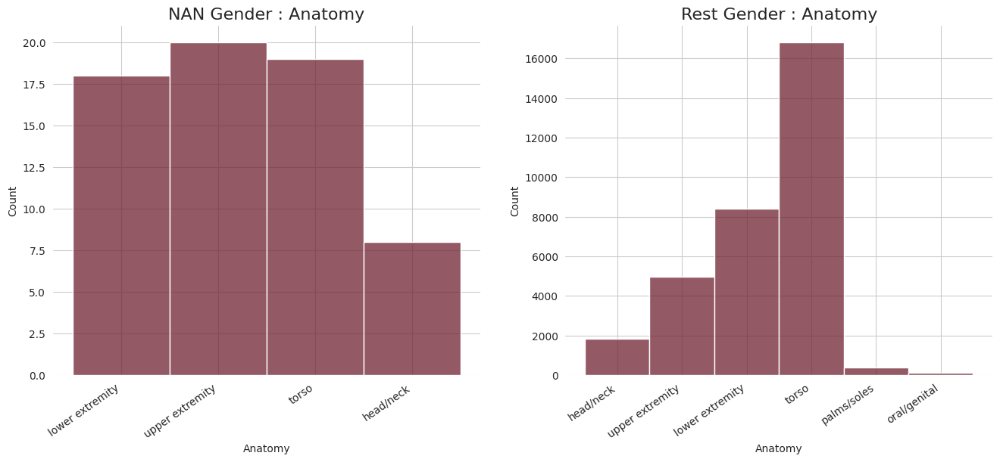

In [ ]:
nan_sex = train_df[train_df['sex'].isna()]
is_sex = train_df[train_df['sex'].notna()]

# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.histplot(nan_sex['Anatomy'], ax = ax1, color='#6F2232')
b = sns.histplot(is_sex['Anatomy'], ax = ax2, color='#6F2232')
ax1.set_title('NAN Gender : Anatomy', fontsize=16)
ax2.set_title('Rest Gender : Anatomy', fontsize=16)

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
b.set_xticklabels(b.get_xticklabels(), rotation=35, ha="right")
sns.despine(left=True, bottom=True);

benign_count = nan_sex['is_malignant'].value_counts()[0]
print(f'Out of {len(nan_sex)} NAN values, {benign_count} are benign and {len(nan_sex) - benign_count} malignant.\n')

In [ ]:
anatomy = ['lower extremity', 'upper extremity', 'torso']        # Most common anatomy accompanying NANs
train_df[(train_df['Anatomy'].isin(anatomy)) & (train_df['target'] == 0)]['sex'].value_counts()

train_df[train_df['target'] == 0]['sex'].value_counts()

sex
male      16716
female    15761
Name: count, dtype: int64

In [ ]:
train_df['sex'].fillna("male", inplace = True)

Out of 68 NAN values, 68 are benign and 0 malignant.



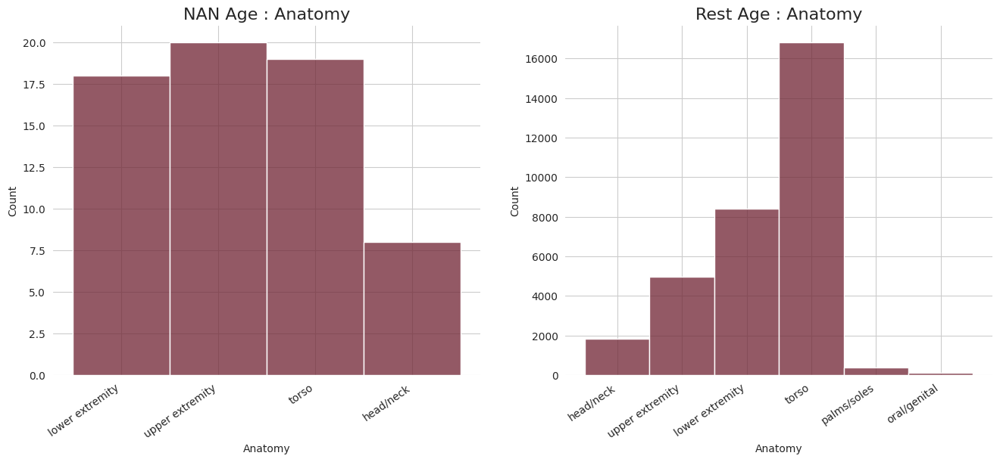

In [ ]:
nan_age = train_df[train_df['Age'].isna()]
is_age = train_df[train_df['Age'].notna()]

# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.histplot(nan_sex['Anatomy'], ax = ax1, color='#6F2232')
b = sns.histplot(is_sex['Anatomy'], ax = ax2, color='#6F2232')
ax1.set_title('NAN Age : Anatomy', fontsize=16)
ax2.set_title('Rest Age : Anatomy', fontsize=16)

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
b.set_xticklabels(b.get_xticklabels(), rotation=35, ha="right")
sns.despine(left=True, bottom=True);

benign_count = nan_age['is_malignant'].value_counts()[0]
print(f'Out of {len(nan_age)} NAN values, {benign_count} are benign and {len(nan_age) - benign_count} malignant.\n')

In [ ]:
anatomy = ['lower extremity', 'upper extremity', 'torso']
median = train_df[(train_df['Anatomy'].isin(anatomy)) & (train_df['target'] == 0) & (train_df['sex'] == 'male')]['Age'].median()
print('Median is:', median)

Median is: 50.0


In [ ]:
train_df['Age'].fillna(median, inplace = True)

Out of 527 NAN values, 518 are benign and 9 malignant.



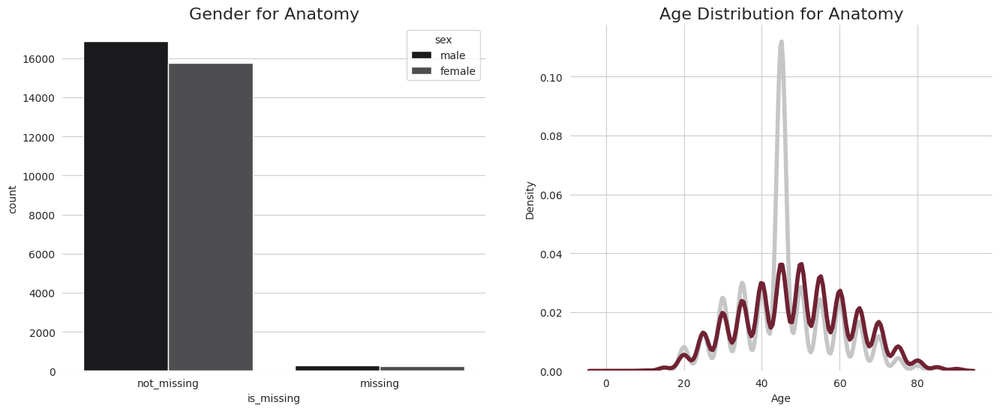

In [ ]:
anatomy = train_df.copy()
anatomy['is_missing'] = np.where(train_df['Anatomy'].isna()==True, 'missing', 'not_missing')
nan_anatomy = anatomy[anatomy['is_missing'] == 'missing']
is_anatomy = anatomy[anatomy['is_missing'] != 'missing']

# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

sns.countplot(x='is_missing', hue='sex', data=anatomy, palette=colors_nude, ax=ax1)

# Missing Anatomy Age Distribution in grey
sns.kdeplot(nan_anatomy['Age'],
            label='Missing', ax=ax2,
            color=colors_nude[2], linewidth=4, bw=0.1, fill=False)

# Not Missing Anatomy Age Distribution in dark red
sns.kdeplot(is_anatomy['Age'],
            label='Not Missing', ax=ax2,
            color=colors_nude[3], linewidth=4, bw=0.1, fill=False)

ax1.set_title('Gender for Anatomy', fontsize=16)
ax2.set_title('Age Distribution for Anatomy', fontsize=16)
sns.despine(left=True, bottom=True);

benign_count = nan_anatomy['is_malignant'].value_counts()[0]
print(f'Out of {len(nan_anatomy)} NAN values, {benign_count} are benign and {len(nan_anatomy) - benign_count} malignant.\n')

In [ ]:
train_df['Anatomy'].fillna('torso', inplace = True)

## Handling Missing Data in Test Data

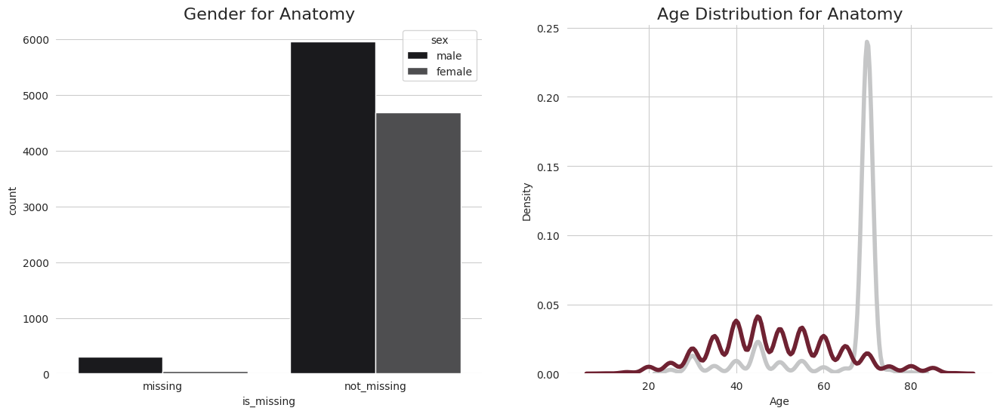

In [ ]:
anatomy = test_df.copy()
anatomy['is_missing'] = np.where(test_df['Anatomy'].isna()==True, 'missing', 'not_missing')
nan_anatomy = anatomy[anatomy['is_missing'] == 'missing']
is_anatomy = anatomy[anatomy['is_missing'] != 'missing']

# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

sns.countplot(x='is_missing', hue='sex', data=anatomy, palette=colors_nude, ax=ax1)

sns.kdeplot(nan_anatomy['Age'], label='Missing', ax=ax2, legend=True,
            color=colors_nude[2], linewidth=4, bw=0.1, fill=False)     # Missing Anatomy in grey

sns.kdeplot(is_anatomy['Age'], label='Not Missing', ax=ax2, legend=True,
            color=colors_nude[3], linewidth=4, bw=0.1, fill=False)     # Not Missing in dark red

ax1.set_title('Gender for Anatomy', fontsize=16)
ax2.set_title('Age Distribution for Anatomy', fontsize=16)
sns.despine(left=True, bottom=True);

In [ ]:
test_df['Anatomy'].fillna('torso', inplace = True)

# 4. EDA

## Train EDA

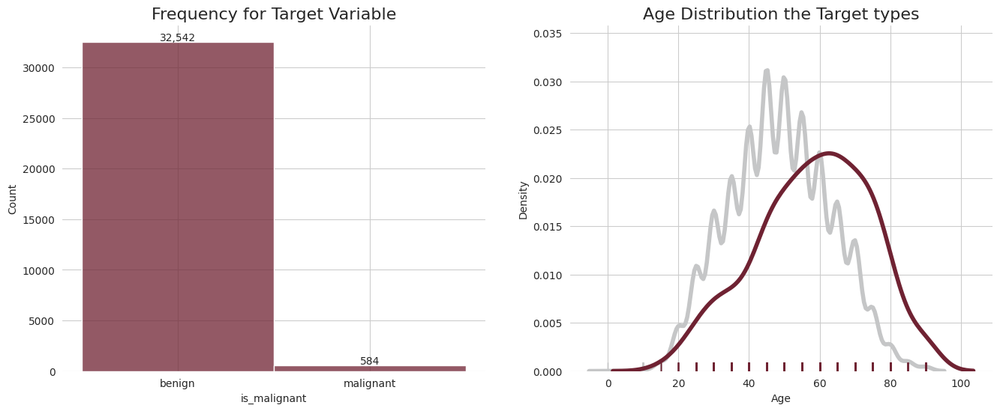

In [ ]:
# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.histplot(train_df['is_malignant'], color=colors_nude[3], ax=ax1)

# Benign age distribution in grey
b = sns.distplot(a = train_df[train_df['target']==0]['Age'], ax=ax2, color=colors_nude[2],
                 hist=False, rug=True, kde_kws=dict(linewidth=4), label='Benign')
# Malignant age distribution in dark red
c = sns.distplot(a = train_df[train_df['target']==1]['Age'], ax=ax2, color=colors_nude[3],
                 hist=False, rug=True, kde_kws=dict(linewidth=4), label='Malignant')

for p in a.patches:
    a.annotate(format(p.get_height(), ','),
           (p.get_x() + p.get_width() / 2.,
            p.get_height()), ha = 'center', va = 'center',
           xytext = (0, 4), textcoords = 'offset points')

ax1.set_title('Frequency for Target Variable', fontsize=16)
ax2.set_title('Age Distribution the Target types', fontsize=16)
sns.despine(left=True, bottom=True);

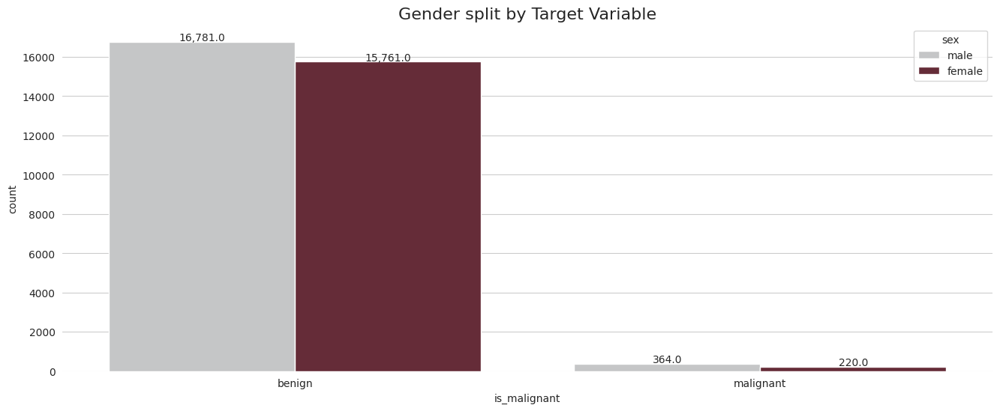

In [ ]:
plt.figure(figsize=(16, 6))
a = sns.countplot(x='is_malignant', hue='sex', data=train_df, palette=colors_nude[2:4])

for p in a.patches:
    a.annotate(format(p.get_height(), ','),
           (p.get_x() + p.get_width() / 2.,
            p.get_height()), ha = 'center', va = 'center',
           xytext = (0, 4), textcoords = 'offset points')

plt.title('Gender split by Target Variable', fontsize=16)
sns.despine(left=True, bottom=True);

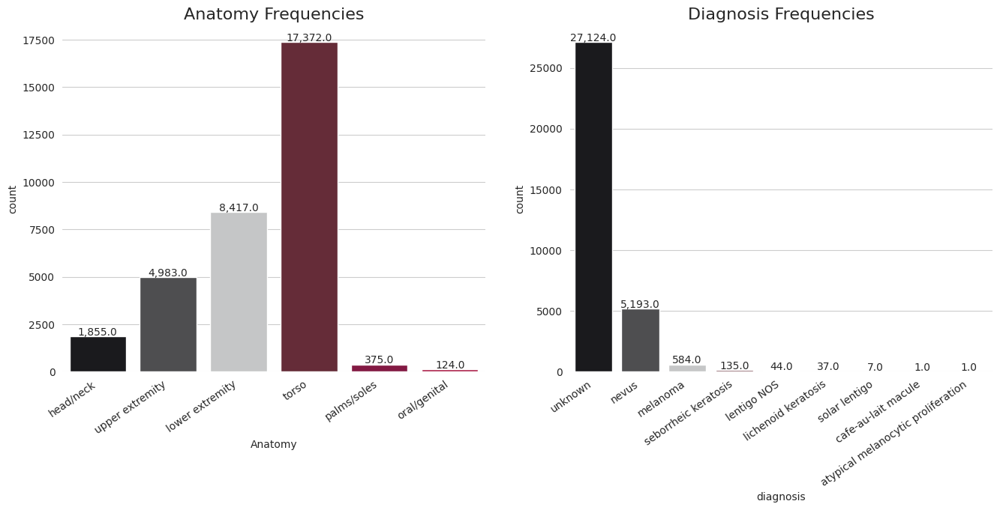

In [ ]:
# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.countplot(x='Anatomy', data=train_df, ax=ax1, palette = colors_nude)
b = sns.countplot(x='diagnosis', data=train_df, ax=ax2, palette = colors_nude)

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
b.set_xticklabels(b.get_xticklabels(), rotation=35, ha="right")

for p in a.patches:
    a.annotate(format(p.get_height(), ','),
           (p.get_x() + p.get_width() / 2.,
            p.get_height()), ha = 'center', va = 'center',
           xytext = (0, 4), textcoords = 'offset points')

for p in b.patches:
    b.annotate(format(p.get_height(), ','),
           (p.get_x() + p.get_width() / 2.,
            p.get_height()), ha = 'center', va = 'center',
           xytext = (0, 4), textcoords = 'offset points')

ax1.set_title('Anatomy Frequencies', fontsize=16)
ax2.set_title('Diagnosis Frequencies', fontsize=16)
sns.despine(left=True, bottom=True);

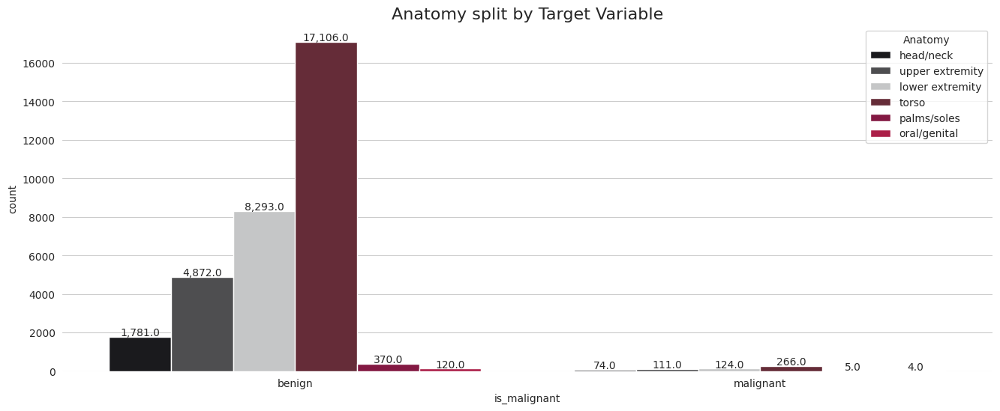

In [ ]:
plt.figure(figsize=(16, 6))
a = sns.countplot(x='is_malignant', data=train_df, hue='Anatomy', palette=colors_nude)

for p in a.patches:
    a.annotate(format(p.get_height(), ','),
           (p.get_x() + p.get_width() / 2.,
            p.get_height()), ha = 'center', va = 'center',
           xytext = (0, 4), textcoords = 'offset points')

plt.title('Anatomy split by Target Variable', fontsize=16)
sns.despine(left=True, bottom=True);

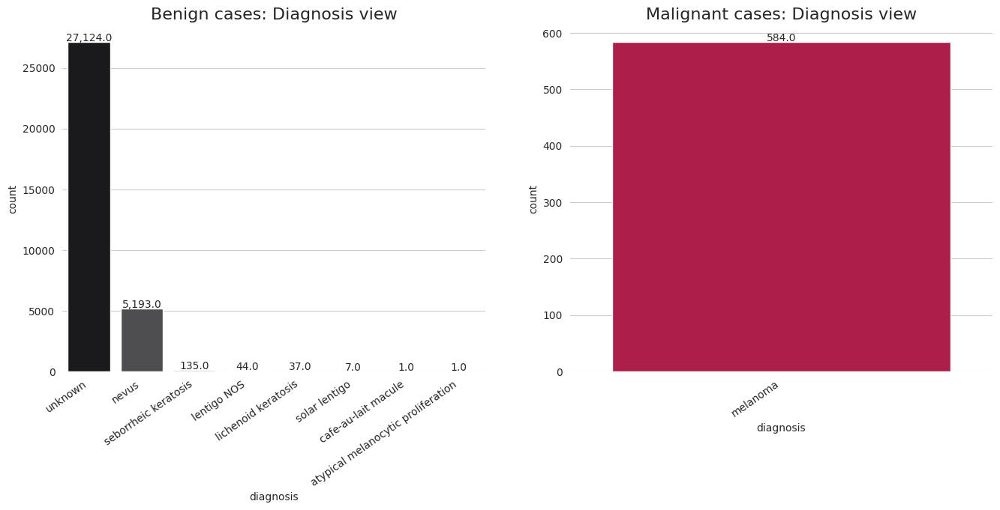

In [ ]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.countplot(x='diagnosis',data=train_df[train_df['target']==0], ax=ax1, palette = colors_nude)
b = sns.countplot(x='diagnosis', ax=ax2, data=train_df[train_df['target']==1], palette = colors_nude[-1:])

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
b.set_xticklabels(b.get_xticklabels(), rotation=35, ha="right")

for p in a.patches:
    a.annotate(format(p.get_height(), ','),
           (p.get_x() + p.get_width() / 2.,
            p.get_height()), ha = 'center', va = 'center',
           xytext = (0, 4), textcoords = 'offset points')

for p in b.patches:
    b.annotate(format(p.get_height(), ','),
           (p.get_x() + p.get_width() / 2.,
            p.get_height()), ha = 'center', va = 'center',
           xytext = (0, 4), textcoords = 'offset points')

ax1.set_title('Benign cases: Diagnosis view', fontsize=16)
ax2.set_title('Malignant cases: Diagnosis view', fontsize=16)
sns.despine(left=True, bottom=True);

## Test EDA

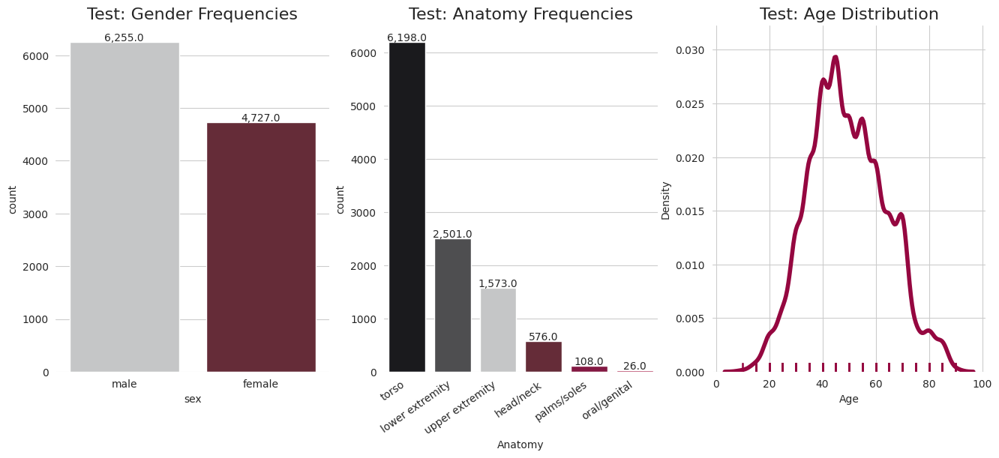

In [ ]:
# Figure
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (16, 6))

a = sns.countplot(data=test_df, x='sex', palette=colors_nude[2:4], ax=ax1)
b = sns.countplot(data=test_df, x='Anatomy', ax=ax2, palette = colors_nude)
c = sns.distplot(a = test_df['Age'], ax=ax3, color=colors_nude[4],
                 hist=False, rug=True, kde_kws=dict(linewidth=4))

for p in a.patches:
    a.annotate(format(p.get_height(), ','),
           (p.get_x() + p.get_width() / 2.,
            p.get_height()), ha = 'center', va = 'center',
           xytext = (0, 4), textcoords = 'offset points')

for p in b.patches:
    b.annotate(format(p.get_height(), ','),
           (p.get_x() + p.get_width() / 2.,
            p.get_height()), ha = 'center', va = 'center',
           xytext = (0, 4), textcoords = 'offset points')

b.set_xticklabels(b.get_xticklabels(), rotation=35, ha="right")

ax1.set_title('Test: Gender Frequencies', fontsize=16)
ax2.set_title('Test: Anatomy Frequencies', fontsize=16)
ax3.set_title('Test: Age Distribution', fontsize=16)
sns.despine(left=True, bottom=True);

## Train and Test Distribution Comparison

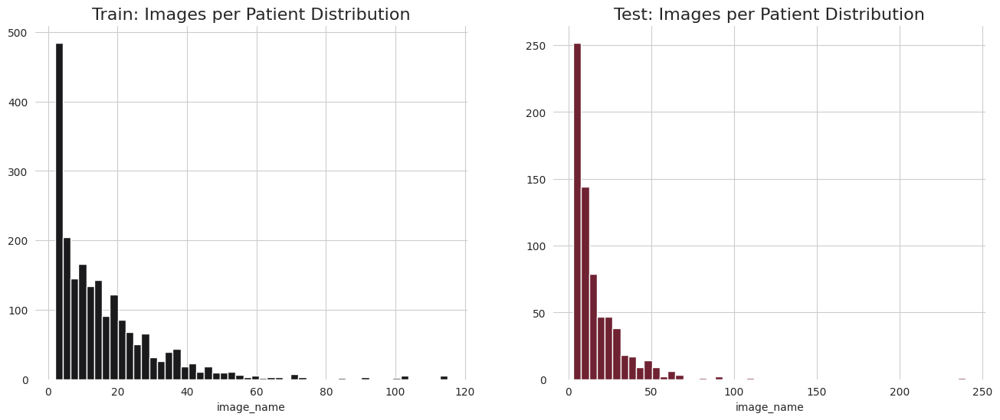

In [ ]:
# Count the number of images per ID
patients_count_train = train_df.groupby(by='Id')['image_name'].count().reset_index()
patients_count_test = test_df.groupby(by='Id')['image_name'].count().reset_index()

# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.distplot(patients_count_train['image_name'], kde=False, bins=50,
                 ax=ax1, color=colors_nude[0], hist_kws={'alpha': 1})
b = sns.distplot(patients_count_test['image_name'], kde=False, bins=50,
                 ax=ax2, color=colors_nude[3], hist_kws={'alpha': 1})

ax1.set_title('Train: Images per Patient Distribution', fontsize=16)
ax2.set_title('Test: Images per Patient Distribution', fontsize=16)
sns.despine(left=True, bottom=True);

# 5. Data Preprocessing

## Tabular Data

### Train Data Label Encoding

In [ ]:
to_encode = ['sex', 'Anatomy', 'diagnosis']
encoded_all = []

label_encoder = LabelEncoder()

for column in to_encode:
    train_df[column] = label_encoder.fit_transform(train_df[column])

if 'is_malignant' in train_df.columns : train_df.drop(['is_malignant'], axis=1, inplace=True)

### Test Data Label Encoding

In [ ]:
to_encode = ['sex', 'Anatomy']
encoded_all = []

label_encoder = LabelEncoder()

for column in to_encode:
    test_df[column] = label_encoder.fit_transform(test_df[column])

### One Hot Encoding Roman Training Data

In [ ]:
roman_train

,image_name,Id,sex,Age,Anatomy,target
0,ISIC_2637011,IP_7279968,male,45.0,head/neck,0
1,ISIC_0015719,IP_3075186,female,45.0,upper extremity,0
2,ISIC_0052212,IP_2842074,female,50.0,lower extremity,0
3,ISIC_0068279,IP_6890425,female,45.0,head/neck,0
4,ISIC_0074268,IP_8723313,female,55.0,upper extremity,0
...,...,...,...,...,...,...
37643,ISIC_0073231,BCN_0005418,female,55.0,anterior torso,1
37644,ISIC_0073237,BCN_0001536,female,45.0,lower extremity,1
37645,ISIC_0073238,BCN_0005240,female,45.0,upper extremity,1
37646,ISIC_0073241,BCN_0004405,male,60.0,palms/soles,1


In [ ]:
to_encode = ['sex', 'Anatomy']

label_encoder = LabelEncoder()

for column in to_encode:
    roman_train[column] = label_encoder.fit_transform(roman_train[column].astype(str))

## Images

### DICOM Images

#### Get Idea About Sizes

In [ ]:
shapes_train = []

for k, path in enumerate(train_df['path_jpeg']):
    image = Image.open(path)
    shapes_train.append(image.size)

    if k >= 100: break

shapes_train = pd.DataFrame(data = shapes_train, columns = ['H', 'W'], dtype='object')
shapes_train['Size'] = '[' + shapes_train['H'].astype(str) + ', ' + shapes_train['W'].astype(str) + ']'

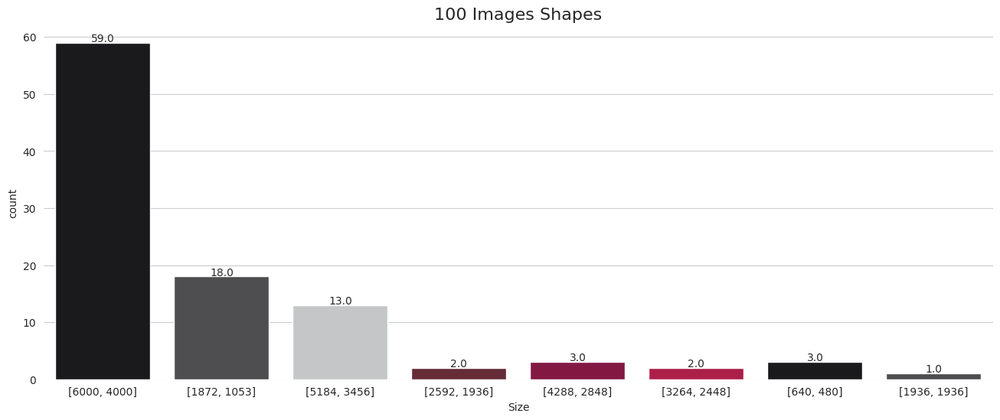

In [ ]:
plt.figure(figsize = (16, 6))

a = sns.countplot(data=shapes_train, x='Size', palette=colors_nude)

for p in a.patches:
    a.annotate(format(p.get_height(), ','),
           (p.get_x() + p.get_width() / 2.,
            p.get_height()), ha = 'center', va = 'center',
           xytext = (0, 4), textcoords = 'offset points')

plt.title('100 Images Shapes', fontsize=16)
sns.despine(left=True, bottom=True);

#### Inspect Images

In [ ]:
def show_images(data, n = 5, rows=1, cols=5, title='Default'):
    plt.figure(figsize=(16,4))

    for k, path in enumerate(data['path_dicom'][:n]):
        image = pydicom.dcmread(path)
        image = image.pixel_array

        # image = resize(image, (200, 200), anti_aliasing=True)

        plt.suptitle(title, fontsize = 16)
        plt.subplot(rows, cols, k+1)
        plt.imshow(image)
        plt.axis('off')

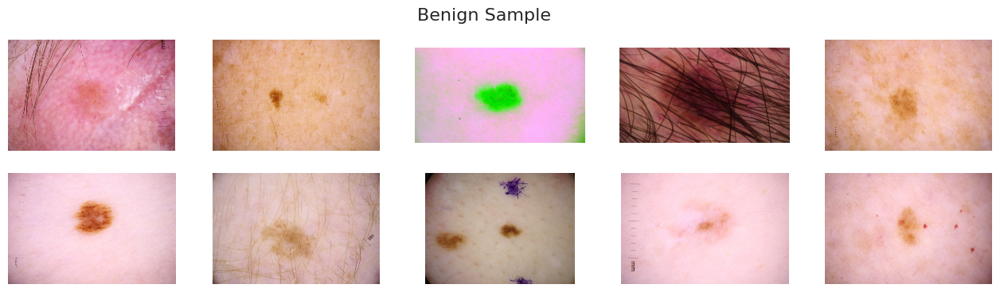

In [ ]:
show_images(train_df[train_df['target'] == 0], n=10, rows=2, cols=5, title='Benign Sample')

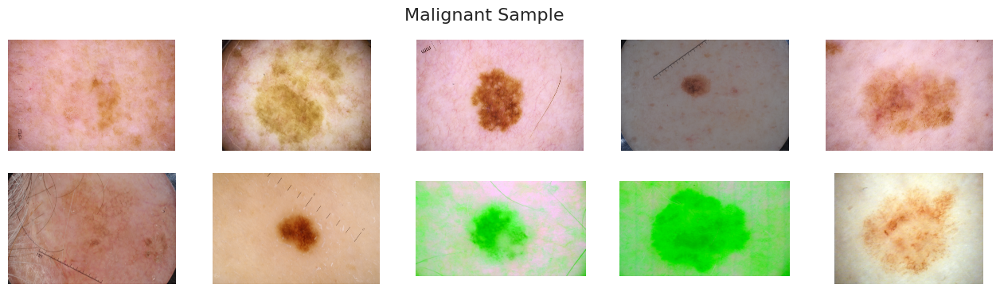

In [ ]:
show_images(train_df[train_df['target'] == 1], n=10, rows=2, cols=5, title='Malignant Sample')

#### Greyscale Filter

## **Subset of dataset loaded**

In [4]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG19, EfficientNetB7
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf


In [ ]:
/content/drive/MyDrive/freelancing/melanoma-skin-cancer-classifier/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset

In [8]:
# Define dataset paths
dataset_path = "/content/drive/MyDrive/freelancing/melanoma-skin-cancer-classifier/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset"
train_dir = os.path.join(dataset_path, 'train')
val_dir = os.path.join(dataset_path, 'test')


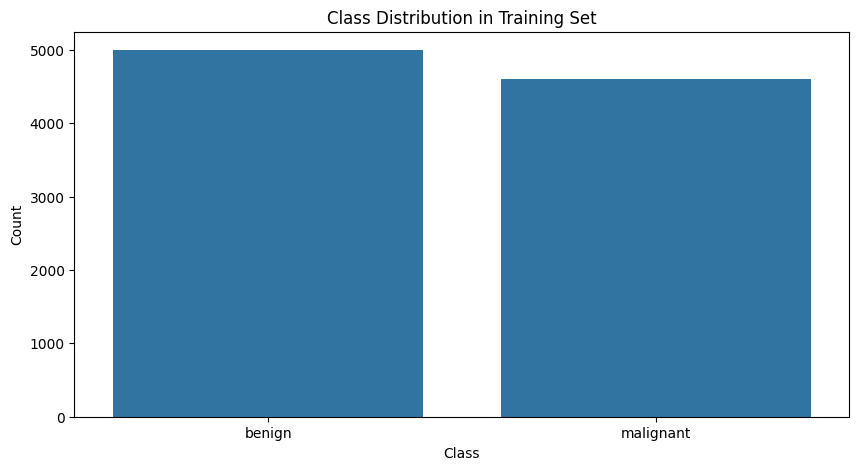

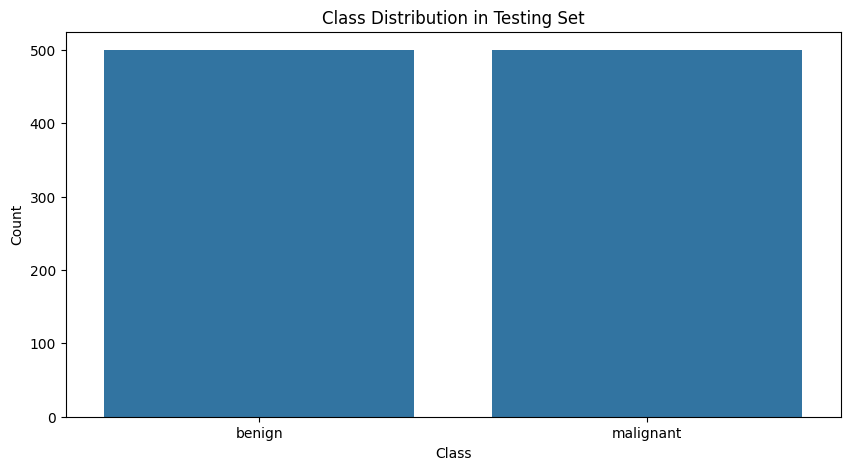

In [9]:
# Step 1: Exploratory Data Analysis (EDA)

# Count number of images per class in train and test
def count_images_in_directory(directory):
    class_counts = {}
    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            class_counts[class_name] = len(os.listdir(class_path))
    return class_counts

train_counts = count_images_in_directory(train_dir)
val_counts = count_images_in_directory(val_dir)

# Visualize the data distribution
train_df = pd.DataFrame(list(train_counts.items()), columns=['Class', 'Count'])
val_df = pd.DataFrame(list(val_counts.items()), columns=['Class', 'Count'])

plt.figure(figsize=(10, 5))
sns.barplot(x='Class', y='Count', data=train_df)
plt.title('Class Distribution in Training Set')
plt.show()

plt.figure(figsize=(10, 5))
sns.barplot(x='Class', y='Count', data=val_df)
plt.title('Class Distribution in Testing Set')
plt.show()


In [10]:
# Step 2: Data Preprocessing
image_size = (224, 224)  # Standard size for VGG19 and EfficientNet
batch_size = 32

data_gen = ImageDataGenerator(rescale=1.0/255, horizontal_flip=True, vertical_flip=True, zoom_range=0.2)

train_generator = data_gen.flow_from_directory(
    train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical')

val_generator = data_gen.flow_from_directory(
    val_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical')


Found 9605 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


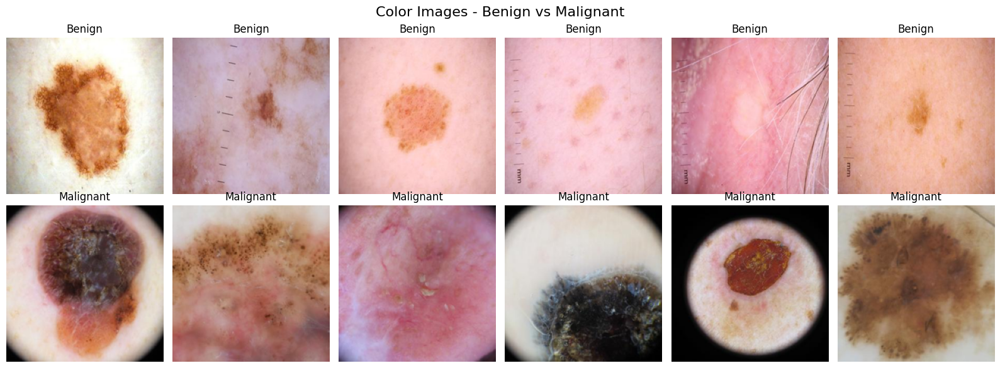

In [11]:
import matplotlib.pyplot as plt
import os
from PIL import Image

# Function to display benign and malignant images side by side
def display_color_images(benign_paths, malignant_paths, nrows=2, ncols=6, title="Benign and Malignant Images"):
    """
    Display benign and malignant images side by side in color.

    Parameters:
    - benign_paths: List of file paths to benign images.
    - malignant_paths: List of file paths to malignant images.
    - nrows: Number of rows in the grid.
    - ncols: Number of columns in the grid.
    - title: Title of the visualization.
    """
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 6))
    plt.suptitle(title, fontsize=16)

    # Combine both lists
    combined_paths = benign_paths[:ncols] + malignant_paths[:ncols]  # Take `ncols` from each class

    for i, path in enumerate(combined_paths):
        if i >= nrows * ncols:
            break  # Stop if more images than grid slots

        # Read the image using PIL
        image = Image.open(path).resize((200, 200))  # Resize to 200x200 pixels

        # Determine subplot position
        x = i // ncols
        y = i % ncols
        axes[x, y].imshow(image)
        axes[x, y].axis('off')

        # Add a title to distinguish classes
        if i < ncols:
            axes[x, y].set_title("Benign")
        else:
            axes[x, y].set_title("Malignant")

    plt.tight_layout()
    plt.show()

# Example Usage
# Define directories for benign and malignant images
benign_dir = os.path.join(train_dir, 'benign')
malignant_dir = os.path.join(train_dir, 'malignant')

# Get a list of image paths for each class
benign_paths = [os.path.join(benign_dir, img) for img in os.listdir(benign_dir) if img.endswith(('.jpg', '.png'))]
malignant_paths = [os.path.join(malignant_dir, img) for img in os.listdir(malignant_dir) if img.endswith(('.jpg', '.png'))]

# Display benign and malignant images side by side
display_color_images(benign_paths, malignant_paths, nrows=2, ncols=6, title="Color Images - Benign vs Malignant")


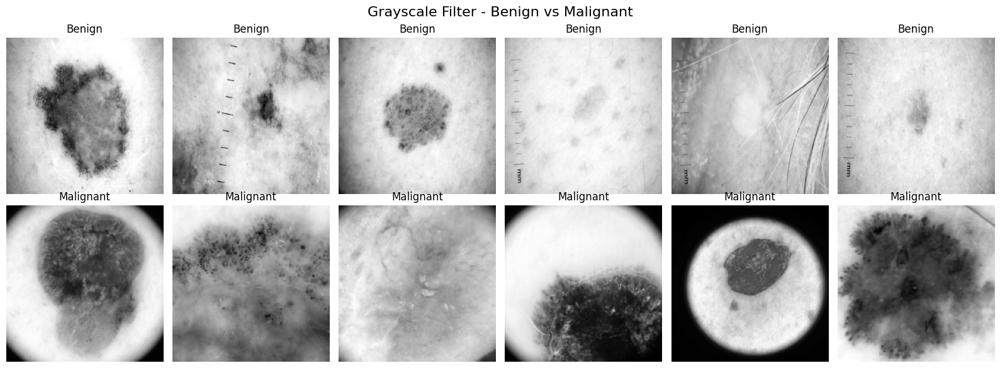

In [12]:
import matplotlib.pyplot as plt
import cv2
import os

# Function to display images with a grayscale filter applied
def display_benign_malignant_images(benign_paths, malignant_paths, nrows=2, ncols=6, title="Benign and Malignant Images"):
    """
    Apply a grayscale filter to benign and malignant images and display them.

    Parameters:
    - benign_paths: List of file paths to benign images.
    - malignant_paths: List of file paths to malignant images.
    - nrows: Number of rows in the grid.
    - ncols: Number of columns in the grid.
    - title: Title of the visualization.
    """
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 6))
    plt.suptitle(title, fontsize=16)

    # Combine both lists
    combined_paths = benign_paths[:ncols] + malignant_paths[:ncols]  # Take `ncols` from each class

    for i, path in enumerate(combined_paths):
        if i >= nrows * ncols:
            break  # Stop if more images than grid slots

        # Read and preprocess the image
        image = cv2.imread(path)  # Read the image as a NumPy array
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
        image = cv2.resize(image, (200, 200))  # Resize to 200x200 pixels

        # Determine subplot position
        x = i // ncols
        y = i % ncols
        axes[x, y].imshow(image, cmap=plt.cm.gray)
        axes[x, y].axis('off')

        # Add a title to distinguish classes
        if i < ncols:
            axes[x, y].set_title("Benign")
        else:
            axes[x, y].set_title("Malignant")

    plt.tight_layout()
    plt.show()

# Example Usage
# Define directories for benign and malignant images
benign_dir = os.path.join(train_dir, 'benign')
malignant_dir = os.path.join(train_dir, 'malignant')

# Get a list of image paths for each class
benign_paths = [os.path.join(benign_dir, img) for img in os.listdir(benign_dir) if img.endswith(('.jpg', '.png'))]
malignant_paths = [os.path.join(malignant_dir, img) for img in os.listdir(malignant_dir) if img.endswith(('.jpg', '.png'))]

# Display benign and malignant images side by side
display_benign_malignant_images(benign_paths, malignant_paths, nrows=2, ncols=6, title="Grayscale Filter - Benign vs Malignant")


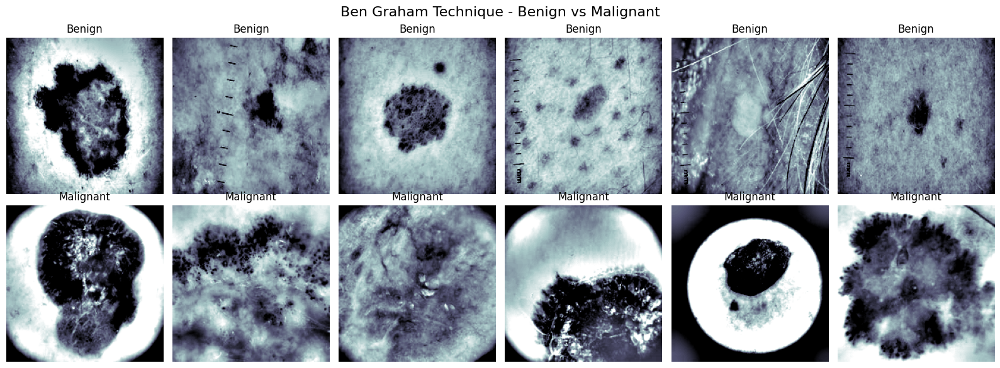

In [13]:
import matplotlib.pyplot as plt
import cv2
import os

# Function to apply Ben Graham preprocessing and display images
def display_ben_graham_images(benign_paths, malignant_paths, nrows=2, ncols=6, title="Ben Graham Technique - Benign vs Malignant"):
    """
    Apply Ben Graham Technique (Grayscale + Gaussian Blur) to benign and malignant images.

    Parameters:
    - benign_paths: List of file paths to benign images.
    - malignant_paths: List of file paths to malignant images.
    - nrows: Number of rows in the grid.
    - ncols: Number of columns in the grid.
    - title: Title of the visualization.
    """
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 6))
    plt.suptitle(title, fontsize=16)

    # Combine both lists
    combined_paths = benign_paths[:ncols] + malignant_paths[:ncols]  # Take `ncols` images from each class

    for i, path in enumerate(combined_paths):
        if i >= nrows * ncols:
            break  # Avoid index-out-of-range errors

        # Read the image
        image = cv2.imread(path)  # Read the image as a NumPy array
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
        image = cv2.resize(image, (200, 200))  # Resize to 200x200 pixels

        # Apply Gaussian blur and enhance
        image = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0, 0), 256 / 10), -4, 128)

        # Determine subplot position
        x = i // ncols
        y = i % ncols
        axes[x, y].imshow(image, cmap=plt.cm.bone)
        axes[x, y].axis('off')

        # Add title to distinguish classes
        if i < ncols:
            axes[x, y].set_title("Benign")
        else:
            axes[x, y].set_title("Malignant")

    plt.tight_layout()
    plt.show()

# Example Usage
# Define directories for benign and malignant images
benign_dir = os.path.join(train_dir, 'benign')
malignant_dir = os.path.join(train_dir, 'malignant')

# Get a list of image paths for each class
benign_paths = [os.path.join(benign_dir, img) for img in os.listdir(benign_dir) if img.endswith(('.jpg', '.png'))]
malignant_paths = [os.path.join(malignant_dir, img) for img in os.listdir(malignant_dir) if img.endswith(('.jpg', '.png'))]

# Apply Ben Graham Technique and display images
display_ben_graham_images(benign_paths, malignant_paths, nrows=2, ncols=6, title="Ben Graham Technique - Benign vs Malignant")


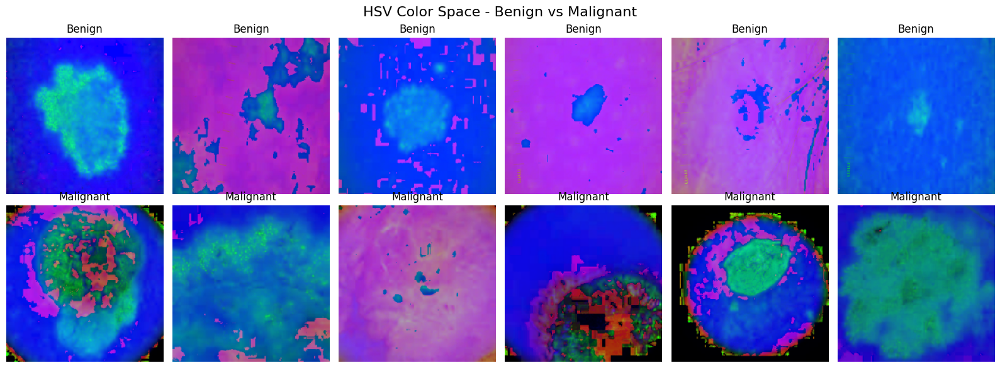

In [14]:
import matplotlib.pyplot as plt
import cv2
import os

# Function to apply HSV transformation and display images
def display_hsv_images(benign_paths, malignant_paths, nrows=2, ncols=6, title="HSV Color Space - Benign vs Malignant"):
    """
    Convert images to HSV color space and display benign and malignant images side by side.

    Parameters:
    - benign_paths: List of file paths to benign images.
    - malignant_paths: List of file paths to malignant images.
    - nrows: Number of rows in the grid.
    - ncols: Number of columns in the grid.
    - title: Title of the visualization.
    """
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 6))
    plt.suptitle(title, fontsize=16)

    # Combine both lists
    combined_paths = benign_paths[:ncols] + malignant_paths[:ncols]  # Take `ncols` images from each class

    for i, path in enumerate(combined_paths):
        if i >= nrows * ncols:
            break  # Avoid index-out-of-range errors

        # Read the image
        image = cv2.imread(path)  # Read the image as a NumPy array
        image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)  # Convert to HSV color space
        image = cv2.resize(image, (200, 200))  # Resize to 200x200 pixels

        # Determine subplot position
        x = i // ncols
        y = i % ncols
        axes[x, y].imshow(image)
        axes[x, y].axis('off')

        # Add title to distinguish classes
        if i < ncols:
            axes[x, y].set_title("Benign")
        else:
            axes[x, y].set_title("Malignant")

    plt.tight_layout()
    plt.show()

# Example Usage
# Define directories for benign and malignant images
benign_dir = os.path.join(train_dir, 'benign')
malignant_dir = os.path.join(train_dir, 'malignant')

# Get a list of image paths for each class
benign_paths = [os.path.join(benign_dir, img) for img in os.listdir(benign_dir) if img.endswith(('.jpg', '.png'))]
malignant_paths = [os.path.join(malignant_dir, img) for img in os.listdir(malignant_dir) if img.endswith(('.jpg', '.png'))]

# Apply HSV Transformation and display images
display_hsv_images(benign_paths, malignant_paths, nrows=2, ncols=6, title="HSV Color Space - Benign vs Malignant")


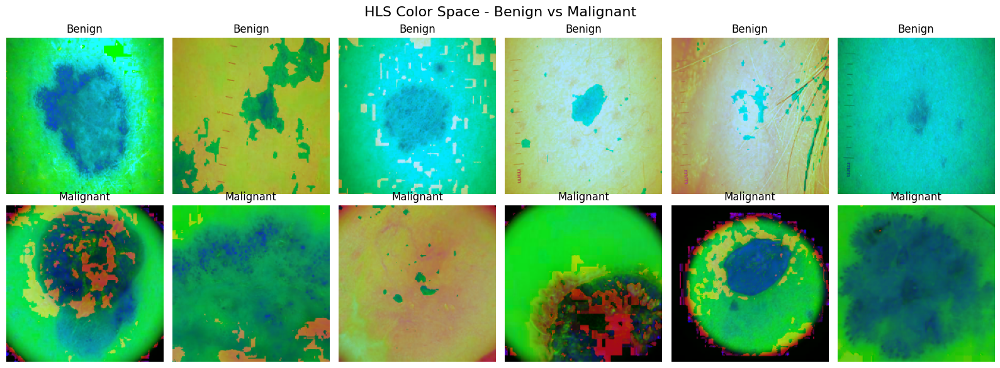

In [15]:
import matplotlib.pyplot as plt
import cv2
import os

# Function to apply HLS transformation and display images
def display_hls_images(benign_paths, malignant_paths, nrows=2, ncols=6, title="HLS Color Space - Benign vs Malignant"):
    """
    Convert images to HLS color space and display benign and malignant images side by side.

    Parameters:
    - benign_paths: List of file paths to benign images.
    - malignant_paths: List of file paths to malignant images.
    - nrows: Number of rows in the grid.
    - ncols: Number of columns in the grid.
    - title: Title of the visualization.
    """
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 6))
    plt.suptitle(title, fontsize=16)

    # Combine both lists
    combined_paths = benign_paths[:ncols] + malignant_paths[:ncols]  # Take `ncols` images from each class

    for i, path in enumerate(combined_paths):
        if i >= nrows * ncols:
            break  # Avoid index-out-of-range errors

        # Read the image
        image = cv2.imread(path)  # Read the image as a NumPy array
        image = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)  # Convert to HLS color space
        image = cv2.resize(image, (200, 200))  # Resize to 200x200 pixels

        # Determine subplot position
        x = i // ncols
        y = i % ncols
        axes[x, y].imshow(image)
        axes[x, y].axis('off')

        # Add title to distinguish classes
        if i < ncols:
            axes[x, y].set_title("Benign")
        else:
            axes[x, y].set_title("Malignant")

    plt.tight_layout()
    plt.show()

# Example Usage
# Define directories for benign and malignant images
benign_dir = os.path.join(train_dir, 'benign')
malignant_dir = os.path.join(train_dir, 'malignant')

# Get a list of image paths for each class
benign_paths = [os.path.join(benign_dir, img) for img in os.listdir(benign_dir) if img.endswith(('.jpg', '.png'))]
malignant_paths = [os.path.join(malignant_dir, img) for img in os.listdir(malignant_dir) if img.endswith(('.jpg', '.png'))]

# Apply HLS Transformation and display images
display_hls_images(benign_paths, malignant_paths, nrows=2, ncols=6, title="HLS Color Space - Benign vs Malignant")


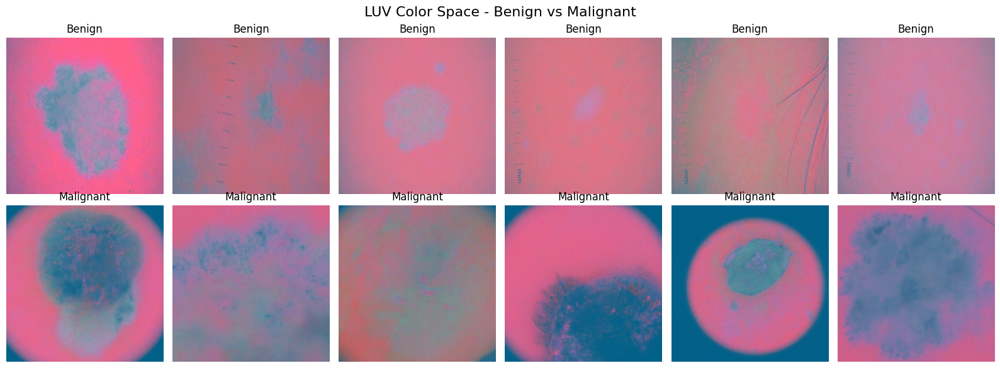

In [16]:
import matplotlib.pyplot as plt
import cv2
import os

# Function to apply LUV transformation and display images
def display_luv_images(benign_paths, malignant_paths, nrows=2, ncols=6, title="LUV Color Space - Benign vs Malignant"):
    """
    Convert images to LUV color space and display benign and malignant images side by side.

    Parameters:
    - benign_paths: List of file paths to benign images.
    - malignant_paths: List of file paths to malignant images.
    - nrows: Number of rows in the grid.
    - ncols: Number of columns in the grid.
    - title: Title of the visualization.
    """
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 6))
    plt.suptitle(title, fontsize=16)

    # Combine both lists
    combined_paths = benign_paths[:ncols] + malignant_paths[:ncols]  # Take `ncols` images from each class

    for i, path in enumerate(combined_paths):
        if i >= nrows * ncols:
            break  # Avoid index-out-of-range errors

        # Read the image
        image = cv2.imread(path)  # Read the image as a NumPy array
        image = cv2.cvtColor(image, cv2.COLOR_BGR2LUV)  # Convert to LUV color space
        image = cv2.resize(image, (200, 200))  # Resize to 200x200 pixels

        # Determine subplot position
        x = i // ncols
        y = i % ncols
        axes[x, y].imshow(image)
        axes[x, y].axis('off')

        # Add title to distinguish classes
        if i < ncols:
            axes[x, y].set_title("Benign")
        else:
            axes[x, y].set_title("Malignant")

    plt.tight_layout()
    plt.show()

# Example Usage
# Define directories for benign and malignant images
benign_dir = os.path.join(train_dir, 'benign')
malignant_dir = os.path.join(train_dir, 'malignant')

# Get a list of image paths for each class
benign_paths = [os.path.join(benign_dir, img) for img in os.listdir(benign_dir) if img.endswith(('.jpg', '.png'))]
malignant_paths = [os.path.join(malignant_dir, img) for img in os.listdir(malignant_dir) if img.endswith(('.jpg', '.png'))]

# Apply LUV Transformation and display images
display_luv_images(benign_paths, malignant_paths, nrows=2, ncols=6, title="LUV Color Space - Benign vs Malignant")


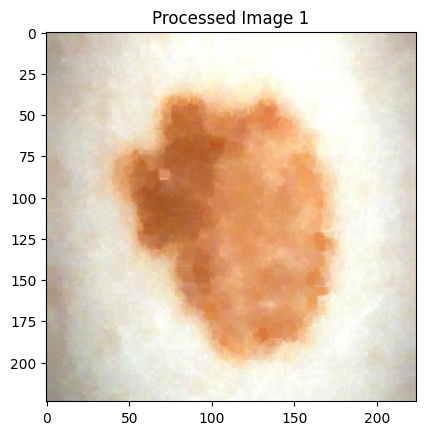

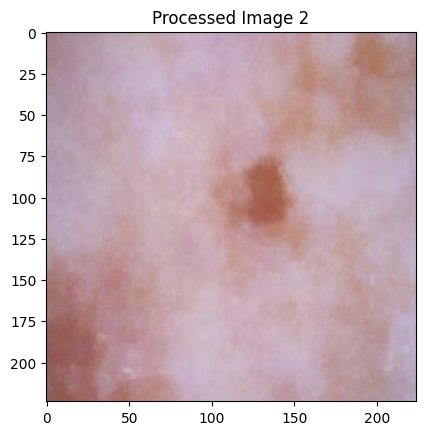

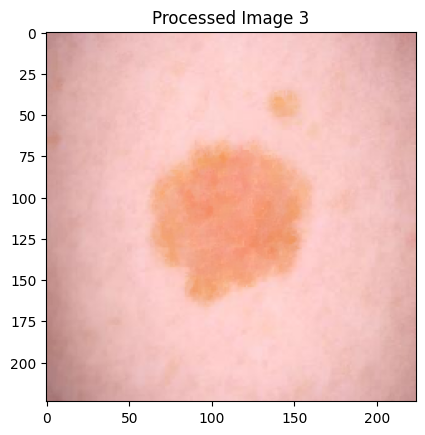

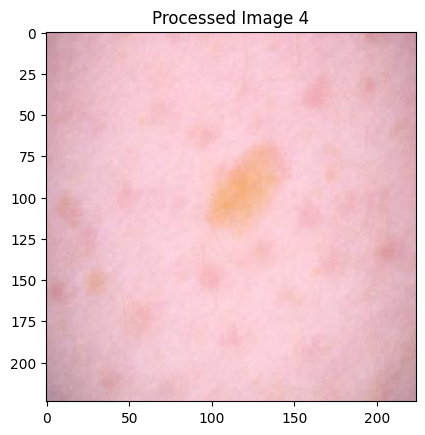

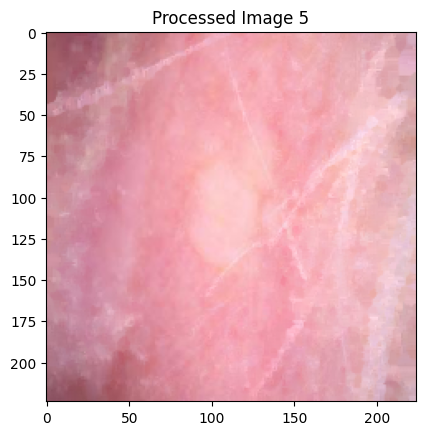

In [17]:
import os
import cv2
import numpy as np
from tensorflow.keras.preprocessing import image


def hair_remove(img):
    # Kernel for morphologyEx
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (17, 17))

    # Apply MORPH_BLACKHAT to image
    blackhat = cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, kernel)

    # Apply thresholding to blackhat, ensuring a single-channel mask
    _, threshold = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)

    # Ensure threshold is a single-channel image (grayscale) and has dtype uint8
    threshold = threshold[:, :, 0].astype(np.uint8) # Convert to single-channel and ensure dtype is uint8

    # Ensure img is in the correct data type: uint8 with 3 channels
    img = img.astype(np.uint8)

    # Inpaint with the original image and threshold image
    final_image = cv2.inpaint(img, threshold, 1, cv2.INPAINT_TELEA)

    return final_image

# Function to load and preprocess images from directory
def load_and_preprocess_images(dir_path, target_size=(224, 224)):
    processed_images = []
    for root, dirs, files in os.walk(dir_path):
        for file in files:
            img_path = os.path.join(root, file)
            img = image.load_img(img_path, target_size=target_size)  # Load image with target size
            img_array = image.img_to_array(img)  # Convert to array
            processed_img = hair_remove(img_array)  # Apply hair removal
            processed_images.append(processed_img)
    return np.array(processed_images)

# Load and process training images
train_images_processed = load_and_preprocess_images(train_dir)

# Load and process validation images
val_images_processed = load_and_preprocess_images(val_dir)

# Optionally, save the processed images if needed
# Example: Save processed images to a directory
# np.save('/path_to_save/train_images_processed.npy', train_images_processed)
# np.save('/path_to_save/val_images_processed.npy', val_images_processed)

# To visualize a few processed images (optional)
import matplotlib.pyplot as plt

# Display example of processed images
for i in range(5):  # Display first 5 processed images from training set
    plt.imshow(train_images_processed[i].astype(np.uint8))
    plt.title(f"Processed Image {i + 1}")
    plt.show()


# 8. Modelling

In [18]:
# Step 3: Model Building
num_classes = len(train_generator.class_indices)

# VGG19 Model
vgg19_base = VGG19(weights='imagenet', include_top=False, input_shape=image_size + (3,))
vgg19_base.trainable = False

vgg19_model = Model(
    inputs=vgg19_base.input,
    outputs=Dense(num_classes, activation='softmax')(Flatten()(vgg19_base.output))
)

vgg19_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])




80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [19]:
# EfficientNetB7 Model
efficientnet_base = EfficientNetB7(weights='imagenet', include_top=False, input_shape=image_size + (3,))
efficientnet_base.trainable = False

efficientnet_model = Model(
    inputs=efficientnet_base.input,
    outputs=Dense(num_classes, activation='softmax')(GlobalAveragePooling2D()(efficientnet_base.output))
)

efficientnet_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

258076736/258076736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [20]:
# Step 4: Model Training
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, verbose=1)


## VGGNet19

In [21]:
# Train VGG19 Model
vgg19_history = vgg19_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,
    callbacks=[early_stopping, reduce_lr]
)



Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


301/301 ━━━━━━━━━━━━━━━━━━━━ 196s 590ms/step - accuracy: 0.7455 - loss: 0.5118 - val_accuracy: 0.8790 - val_loss: 0.3211 - learning_rate: 1.0000e-04
Epoch 2/10
301/301 ━━━━━━━━━━━━━━━━━━━━ 209s 675ms/step - accuracy: 0.8473 - loss: 0.3503 - val_accuracy: 0.8770 - val_loss: 0.2980 - learning_rate: 1.0000e-04
Epoch 3/10
301/301 ━━━━━━━━━━━━━━━━━━━━ 171s 550ms/step - accuracy: 0.8588 - loss: 0.3280 - val_accuracy: 0.8800 - val_loss: 0.2821 - learning_rate: 1.0000e-04
Epoch 4/10
301/301 ━━━━━━━━━━━━━━━━━━━━ 198s 543ms/step - accuracy: 0.8812 - loss: 0.2896 - val_accuracy: 0.8910 - val_loss: 0.2580 - learning_rate: 1.0000e-04
Epoch 5/10
301/301 ━━━━━━━━━━━━━━━━━━━━ 210s 564ms/step - accuracy: 0.8744 - loss: 0.2928 - val_accuracy: 0.8910 - val_loss: 0.2642 - learning_rate: 1.0000e-04
Epoch 6/10
301/301 ━━━━━━━━━━━━━━━━━━━━ 196s 550ms/step - accuracy: 0.8824 - loss: 0.2790 - val_accuracy: 0.8750 - val_loss: 0.2768 - learning_rate: 1.0000e-04
Epoch 7/10
301/301 ━━━━━━━━━━━━━━━━━━━━ 201s 545ms/

## EfficientNetB7

In [22]:
# Train EfficientNetB7 Model
efficientnet_history = efficientnet_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,
    callbacks=[early_stopping, reduce_lr]
)



Epoch 1/10
301/301 ━━━━━━━━━━━━━━━━━━━━ 337s 828ms/step - accuracy: 0.5218 - loss: 0.6927 - val_accuracy: 0.5000 - val_loss: 0.6937 - learning_rate: 1.0000e-04
Epoch 2/10
301/301 ━━━━━━━━━━━━━━━━━━━━ 178s 582ms/step - accuracy: 0.5149 - loss: 0.6938 - val_accuracy: 0.5000 - val_loss: 0.6932 - learning_rate: 1.0000e-04
Epoch 3/10
301/301 ━━━━━━━━━━━━━━━━━━━━ 179s 585ms/step - accuracy: 0.5103 - loss: 0.6937 - val_accuracy: 0.5000 - val_loss: 0.6962 - learning_rate: 1.0000e-04
Epoch 4/10
301/301 ━━━━━━━━━━━━━━━━━━━━ 202s 584ms/step - accuracy: 0.5155 - loss: 0.6941 - val_accuracy: 0.5000 - val_loss: 0.6930 - learning_rate: 1.0000e-04
Epoch 5/10
301/301 ━━━━━━━━━━━━━━━━━━━━ 203s 590ms/step - accuracy: 0.5126 - loss: 0.6931 - val_accuracy: 0.5000 - val_loss: 0.7038 - learning_rate: 1.0000e-04


32/32 ━━━━━━━━━━━━━━━━━━━━ 16s 498ms/step - accuracy: 0.8801 - loss: 0.2537
32/32 ━━━━━━━━━━━━━━━━━━━━ 17s 522ms/step - accuracy: 0.5267 - loss: 0.6917
VGG19 Evaluation - Loss: 0.2493, Accuracy: 0.8900
EfficientNetB7 Evaluation - Loss: 0.6937, Accuracy: 0.5000
32/32 ━━━━━━━━━━━━━━━━━━━━ 16s 465ms/step
Classification Report for VGG19
              precision    recall  f1-score   support

      benign       0.51      0.52      0.52       500
   malignant       0.52      0.51      0.51       500

    accuracy                           0.52      1000
   macro avg       0.52      0.52      0.51      1000
weighted avg       0.52      0.52      0.51      1000



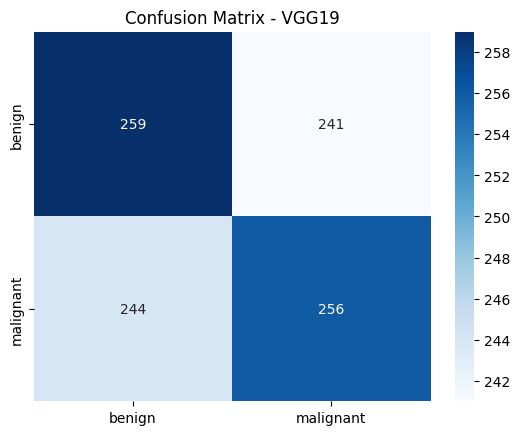

In [23]:
# Step 5: Model Evaluation
vgg19_eval = vgg19_model.evaluate(val_generator)
efficientnet_eval = efficientnet_model.evaluate(val_generator)

print("VGG19 Evaluation - Loss: {:.4f}, Accuracy: {:.4f}".format(vgg19_eval[0], vgg19_eval[1]))
print("EfficientNetB7 Evaluation - Loss: {:.4f}, Accuracy: {:.4f}".format(efficientnet_eval[0], efficientnet_eval[1]))

# Confusion Matrix and Classification Report for VGG19
val_generator.reset()
predictions_vgg19 = np.argmax(vgg19_model.predict(val_generator), axis=1)
true_labels = val_generator.classes

print("Classification Report for VGG19")
print(classification_report(true_labels, predictions_vgg19, target_names=list(val_generator.class_indices.keys())))

cm_vgg19 = confusion_matrix(true_labels, predictions_vgg19)
sns.heatmap(cm_vgg19, annot=True, fmt='d', cmap='Blues', xticklabels=val_generator.class_indices.keys(), yticklabels=val_generator.class_indices.keys())
plt.title("Confusion Matrix - VGG19")
plt.show()



32/32 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step
Classification Report for EfficientNetB7
              precision    recall  f1-score   support

      benign       0.50      1.00      0.67       500
   malignant       0.00      0.00      0.00       500

    accuracy                           0.50      1000
   macro avg       0.25      0.50      0.33      1000
weighted avg       0.25      0.50      0.33      1000



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


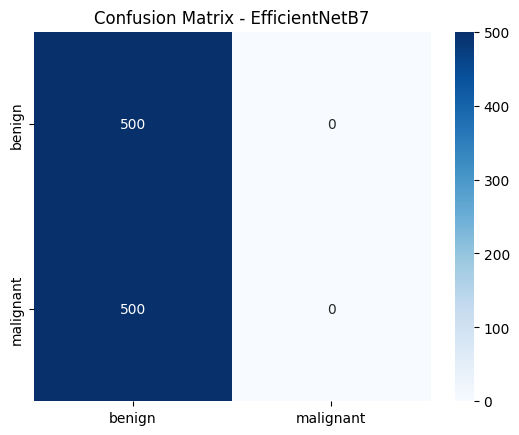

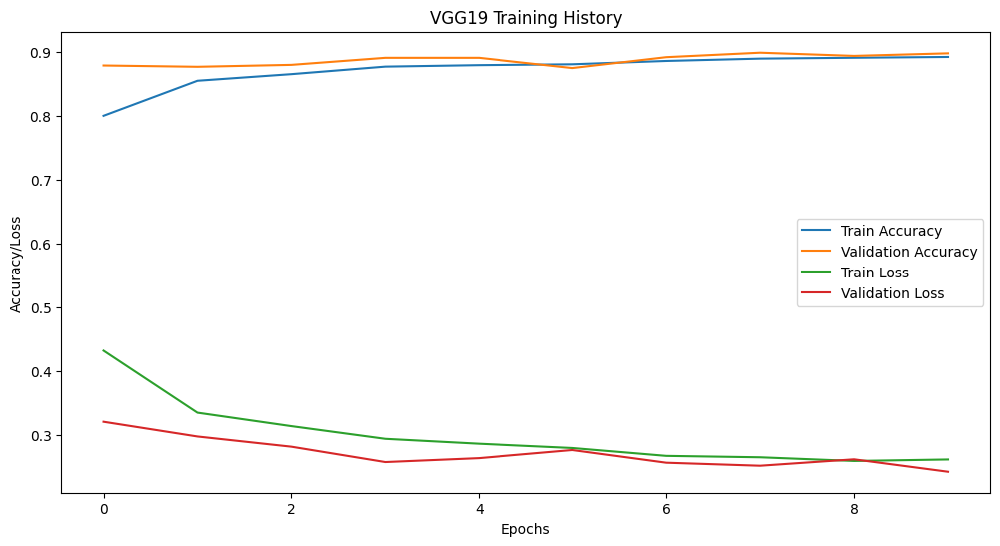

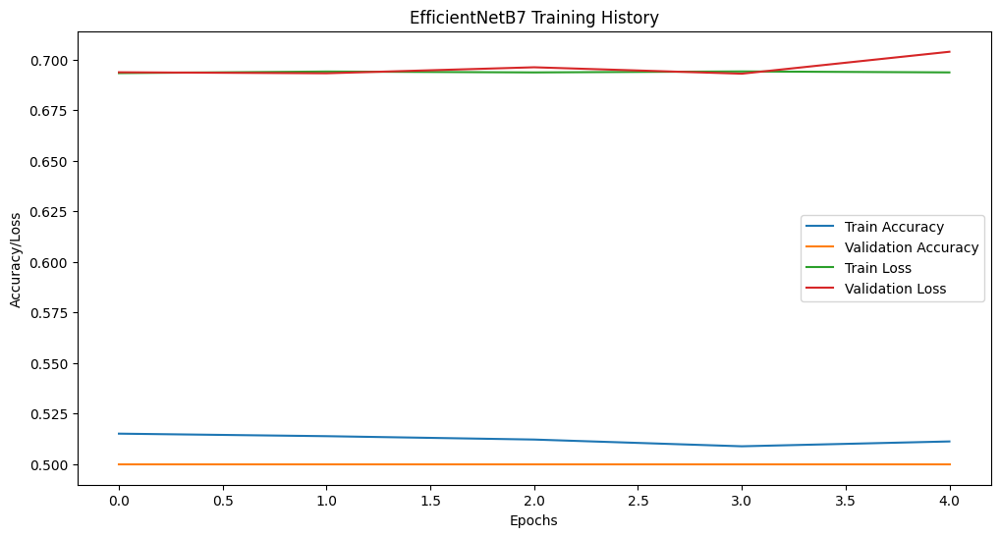

In [24]:
# Confusion Matrix and Classification Report for EfficientNetB7
val_generator.reset()
predictions_eff = np.argmax(efficientnet_model.predict(val_generator), axis=1)

print("Classification Report for EfficientNetB7")
print(classification_report(true_labels, predictions_eff, target_names=list(val_generator.class_indices.keys())))

cm_eff = confusion_matrix(true_labels, predictions_eff)
sns.heatmap(cm_eff, annot=True, fmt='d', cmap='Blues', xticklabels=val_generator.class_indices.keys(), yticklabels=val_generator.class_indices.keys())
plt.title("Confusion Matrix - EfficientNetB7")
plt.show()

# Step 6: Visualize Training History
def plot_training_history(history, title):
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy/Loss')
    plt.show()

plot_training_history(vgg19_history, 'VGG19 Training History')
plot_training_history(efficientnet_history, 'EfficientNetB7 Training History')


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
